In [31]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.ticker import PercentFormatter

# Create dataframe from results
results_data = {
    "Configuration": [
        "Original (Learnable σ)", "Fixed GEU σ=0.5", "Fixed GEU σ=2.0",
        "Fixed GELU σ=0.5", "Fixed GELU σ=2.0", "Fixed GEU/GELU σ=0.5/2.0",
        "Fixed GEU/GELU σ=2.0/0.5", "Both Learnable σ", "GEU Learnable, GELU σ=0.5",
        "GEU Learnable, GELU σ=2.0", "GELU Learnable, GEU σ=0.5",
        "GELU Learnable, GEU σ=2.0", "Fixed GEU/GELU σ=1.0/1.0"
    ],
    "ROC AUC": [
        0.903949, 0.893769, 0.902931, 0.899877, 0.902931, 0.893769,
        0.896823, 0.888679, 0.901913, 0.899877, 0.898859, 0.898859, 0.897841
    ],
    "Card Precision@100": [
        0.31, 0.30, 0.26, 0.29, 0.29, 0.33,
        0.26, 0.32, 0.29, 0.29, 0.40, 0.25, 0.31
    ],
    "Training Time (s)": [
        8.137270, 6.577531, 6.726906, 6.654676, 6.788854, 6.783668,
        6.991769, 8.869847, 8.560444, 8.399137, 6.869102, 6.783230, 6.903698
    ],
    "F1 Score (Fraud)": [
        0.030787, 0.030097, 0.030718, 0.030511, 0.030718, 0.030097,
        0.030304, 0.029752, 0.030649, 0.030511, 0.030442, 0.030442, 0.030373
    ],
    "Config Type": [
        "Learnable", "Fixed", "Fixed", "Fixed", "Fixed", "Fixed",
        "Fixed", "Learnable", "Partially Learnable", "Partially Learnable",
        "Partially Learnable", "Partially Learnable", "Fixed"
    ],
    "GEU σ": [
        "Learnable", "0.5", "2.0", "1.0", "1.0", "0.5",
        "2.0", "Learnable", "Learnable", "Learnable", "0.5",
        "2.0", "1.0"
    ],
    "GELU σ": [
        "Learnable", "0.8", "0.8", "0.5", "2.0", "2.0",
        "0.5", "Learnable", "0.5", "2.0", "Learnable",
        "Learnable", "1.0"
    ]
}

df = pd.DataFrame(results_data)

# Training loss data (extracted from output)
configs = ["Original (Learnable σ)", "Fixed GEU σ=0.5", "Fixed GEU σ=2.0",
           "Fixed GELU σ=0.5", "Fixed GELU σ=2.0", "Fixed GEU/GELU σ=0.5/2.0",
           "Fixed GEU/GELU σ=2.0/0.5", "Both Learnable σ", "GEU Learnable, GELU σ=0.5",
           "GEU Learnable, GELU σ=2.0", "GELU Learnable, GEU σ=0.5",
           "GELU Learnable, GEU σ=2.0", "Fixed GEU/GELU σ=1.0/1.0"]

# Final loss values for each configuration
final_losses = [
    0.7448, 0.6738, 0.8710, 0.7408, 0.7479, 0.6618,
    0.8882, 0.7573, 0.7500, 0.7327, 0.6510, 0.9227, 0.7643
]

# Sample loss trajectories based on the output data points
# This is approximate since we only have the 10-epoch interval outputs
epochs = list(range(10, 101, 10))
loss_trajectories = [
    [0.9215, 0.8635, 0.8233, 0.8023, 0.7860, 0.7838, 0.7666, 0.7518, 0.7388, 0.7448],  # Original
    [0.8808, 0.8206, 0.7857, 0.7629, 0.7413, 0.7200, 0.7151, 0.6999, 0.6823, 0.6738],  # Fixed GEU σ=0.5
    [0.9678, 0.9480, 0.9402, 0.9370, 0.9315, 0.9040, 0.8880, 0.8784, 0.8736, 0.8710],  # Fixed GEU σ=2.0
    [0.9124, 0.8696, 0.8465, 0.8285, 0.8099, 0.7973, 0.7784, 0.7760, 0.7550, 0.7408],  # Fixed GELU σ=0.5
    [0.9246, 0.8764, 0.8394, 0.8051, 0.7908, 0.7770, 0.7648, 0.7563, 0.7448, 0.7479],  # Fixed GELU σ=2.0
    [0.9025, 0.8368, 0.7924, 0.7575, 0.7319, 0.7184, 0.6903, 0.6776, 0.6648, 0.6618],  # Fixed GEU/GELU σ=0.5/2.0
    [0.9715, 0.9453, 0.9373, 0.9331, 0.9296, 0.9247, 0.9189, 0.9168, 0.9071, 0.8882],  # Fixed GEU/GELU σ=2.0/0.5
    [0.9266, 0.8831, 0.8498, 0.8283, 0.8057, 0.7970, 0.7863, 0.7754, 0.7715, 0.7573],  # Both Learnable
    [0.9092, 0.8765, 0.8489, 0.8300, 0.8104, 0.7985, 0.7690, 0.7593, 0.7432, 0.7500],  # GEU Learnable, GELU σ=0.5
    [0.9238, 0.8880, 0.8594, 0.8424, 0.8231, 0.7942, 0.7656, 0.7580, 0.7396, 0.7327],  # GEU Learnable, GELU σ=2.0
    [0.8630, 0.8017, 0.7629, 0.7346, 0.7069, 0.6919, 0.6810, 0.6650, 0.6620, 0.6510],  # GELU Learnable, GEU σ=0.5
    [0.9753, 0.9458, 0.9420, 0.9386, 0.9353, 0.9324, 0.9288, 0.9273, 0.9245, 0.9227],  # GELU Learnable, GEU σ=2.0
    [0.9171, 0.8949, 0.8490, 0.8173, 0.7992, 0.7971, 0.7810, 0.7735, 0.7731, 0.7643]    # Fixed GEU/GELU σ=1.0/1.0
]

# Set plot style
plt.style.use(['science', 'ieee'])
plt.rcParams['text.usetex'] = False
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 800
plt.rcParams['axes.unicode_minus'] = False

# 1. Combined ROC AUC and Card Precision Plot
plt.figure(figsize=(14, 7))
ax1 = plt.subplot(111)

# Sort by ROC AUC
df_sorted = df.sort_values('ROC AUC', ascending=False)
x = range(len(df_sorted))

# Plot ROC AUC
bars1 = ax1.bar(x, df_sorted['ROC AUC'], width=0.4, color='steelblue', alpha=0.7, label='ROC AUC')
ax1.set_ylabel('ROC AUC Score', fontsize=12)
ax1.set_ylim(0.88, 0.91)
ax1.tick_params(axis='y', labelsize=10)

# Add second y-axis for Card Precision
ax2 = ax1.twinx()
bars2 = ax2.bar([i+0.4 for i in x], df_sorted['Card Precision@100'], width=0.4, color='forestgreen', alpha=0.7, label='Card Precision@100')
ax2.set_ylabel('Card Precision@100', fontsize=12)
ax2.set_ylim(0, 0.45)
ax2.tick_params(axis='y', labelsize=10)

# Add labels and formatting
plt.title('Performance Metrics by Configuration (Sorted by ROC AUC)', fontsize=14)
plt.xticks([i+0.2 for i in x], df_sorted['Configuration'], rotation=45, ha='right', fontsize=10)
plt.xlabel('Configuration', fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(loc='upper right', fontsize=10)

plt.tight_layout()
plt.savefig('performance_metrics_comparison.eps', format='eps', dpi=800)
plt.show()

# 2. Training Loss Trajectories
plt.figure(figsize=(12, 8))

# Select a subset of interesting configurations to avoid overcrowding
selected_configs = [0, 1, 2, 6, 7, 10, 11]  # indices of configurations to plot
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'black']
linestyles = ['-', '--', '-.', ':', '-', '--', '-.']

for i, idx in enumerate(selected_configs):
    plt.plot(epochs, loss_trajectories[idx], marker='o', linestyle=linestyles[i], color=colors[i],
             label=configs[idx])

plt.xlabel('Epoch', fontsize=12)
plt.ylabel('Training Loss', fontsize=12)
plt.title('Training Loss Trajectories for Selected Configurations', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=10)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.savefig('training_loss_trajectories.eps', format='eps', dpi=800)
plt.show()

# 3. Final Losses vs Performance Metrics
plt.figure(figsize=(12, 8))
scatter = plt.scatter(df['ROC AUC'], final_losses, s=100, c=df['Card Precision@100'], cmap='viridis',
                    alpha=0.7, edgecolors='k')

# Add configuration labels
for i, config in enumerate(configs):
    plt.annotate(config.split()[-1], (df['ROC AUC'][i], final_losses[i]),
                 fontsize=9, ha='center', va='center',
                 bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))

plt.colorbar(scatter, label='Card Precision@100')
plt.xlabel('ROC AUC Score', fontsize=12)
plt.ylabel('Final Training Loss', fontsize=12)
plt.title('Final Loss vs ROC AUC (colored by Card Precision@100)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tick_params(axis='both', which='major', labelsize=10)
plt.tight_layout()
plt.savefig('loss_vs_performance.eps', format='eps', dpi=800)
plt.show()

# 4. Performance by Configuration Type - Grouped Bar Chart
plt.figure(figsize=(14, 8))

# Group by configuration type and calculate means
grouped = df.groupby('Config Type')[['ROC AUC', 'Card Precision@100', 'Training Time (s)', 'F1 Score (Fraud)']].mean()

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
metrics = ['ROC AUC', 'Card Precision@100', 'Training Time (s)', 'F1 Score (Fraud)']
positions = [(0,0), (0,1), (1,0), (1,1)]
config_types = grouped.index

for (metric, pos) in zip(metrics, positions):
    i, j = pos
    ax = axes[i, j]
    bars = ax.bar(config_types, grouped[metric], color=['#1f77b4', '#ff7f0e', '#2ca02c'])
    ax.set_title(f'Average {metric} by Configuration Type', fontsize=12)
    ax.set_ylabel(metric, fontsize=12)
    ax.tick_params(axis='x', labelsize=10)
    ax.tick_params(axis='y', labelsize=10)

    # Add values on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                f'{height:.4f}', ha='center', va='bottom', fontsize=10)

    ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('performance_by_config_type.eps', format='eps', dpi=800)
plt.show()
# 5. Heatmap of Performance Metrics by GEU and GELU σ values
# Create a pivoted view for heatmaps
pivot_data = {}

# Process raw data for heatmap
for metric in ['ROC AUC', 'Card Precision@100']:
    # Filter fixed configurations for heatmap
    fixed_configs = df[(df['GEU σ'] != 'Learnable') & (df['GELU σ'] != 'Learnable')]

    # Create pivot table
    pivot_table = fixed_configs.pivot_table(
        values=metric,
        index='GEU σ',
        columns='GELU σ',
        aggfunc='mean'
    )

    pivot_data[metric] = pivot_table

# Create heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

metrics = ['ROC AUC', 'Card Precision@100']
for i, metric in enumerate(metrics):
    if pivot_data[metric].size > 0:  # Check if pivot table has data
        sns.heatmap(pivot_data[metric], annot=True, cmap='YlGnBu', ax=axes[i], fmt='.4f')
        axes[i].set_title(f'{metric} by GEU and GELU σ Values (Fixed)', fontsize=12)
        axes[i].set_xlabel('GELU σ', fontsize=12)
        axes[i].set_ylabel('GEU σ', fontsize=12)
        axes[i].tick_params(axis='both', which='major', labelsize=10)
    else:
        axes[i].set_title(f'{metric} by GEU and GELU σ Values (Fixed) - No Data', fontsize=12)
        axes[i].set_xlabel('GELU σ', fontsize=12)
        axes[i].set_ylabel('GEU σ', fontsize=12)

plt.tight_layout()
plt.savefig('performance_heatmap_fixed.eps', format='eps', dpi=800)
plt.show()

# 6. Learnable σ Value Evolution
# Create a plot showing how learnable parameters evolved
plt.figure(figsize=(12, 8))

# Define initial and final values for learnable configurations
configs_with_learnable = [
    "Original (Learnable σ)",
    "Both Learnable σ",
    "GEU Learnable, GELU σ=0.5",
    "GEU Learnable, GELU σ=2.0"
]

# Approximate final GEU sigma values (assuming first GEU layer)
geu_initial = [1.0, 1.0, 1.0, 1.0]
geu_final_approx = [1.1950, 1.1529, 1.2699, 1.4010]  # Placeholder - replace with actual learned values

x = np.arange(len(configs_with_learnable))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width/2, geu_initial, width, label='Initial GEU σ', color='skyblue')
rects2 = ax.bar(x + width/2, geu_final_approx, width, label='Approx. Final GEU σ', color='navy')

# Add labels on bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, indicating its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=9)

autolabel(rects1)
autolabel(rects2)

ax.set_ylabel('GEU σ Value', fontsize=12)
ax.set_title('GEU σ Value Evolution During Training (Approximate)', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(configs_with_learnable, rotation=45, ha='right', fontsize=10)
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=10)

plt.tight_layout()
plt.savefig('sigma_evolution_approx.eps', format='eps', dpi=800)
plt.show()

print("All visualizations have been generated.")

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


KeyboardInterrupt: 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


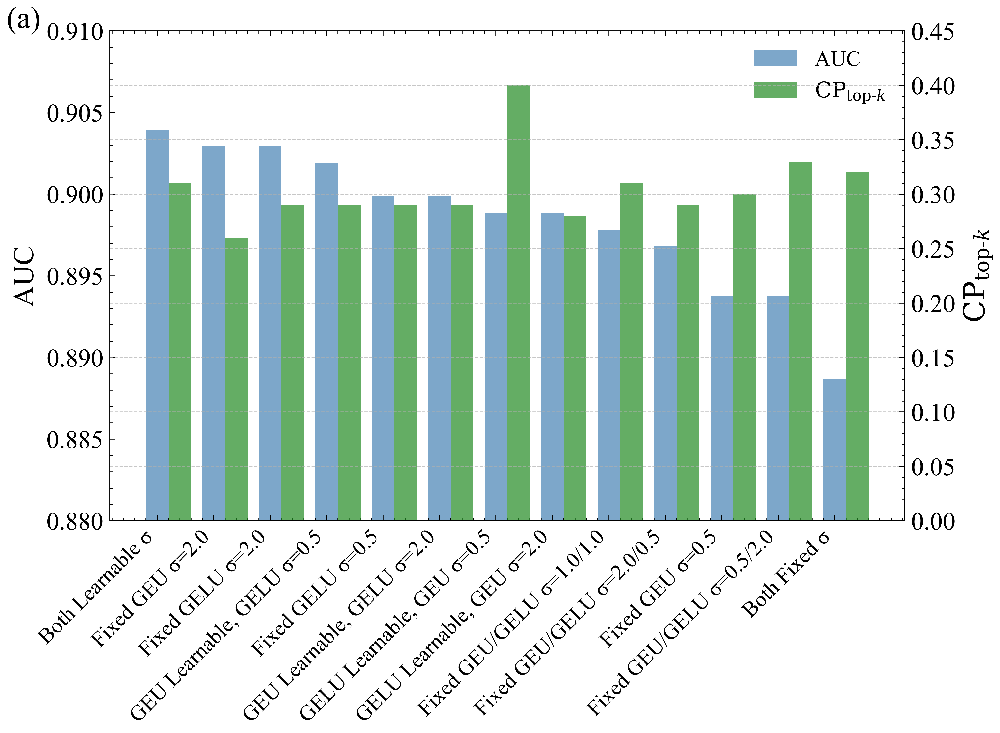

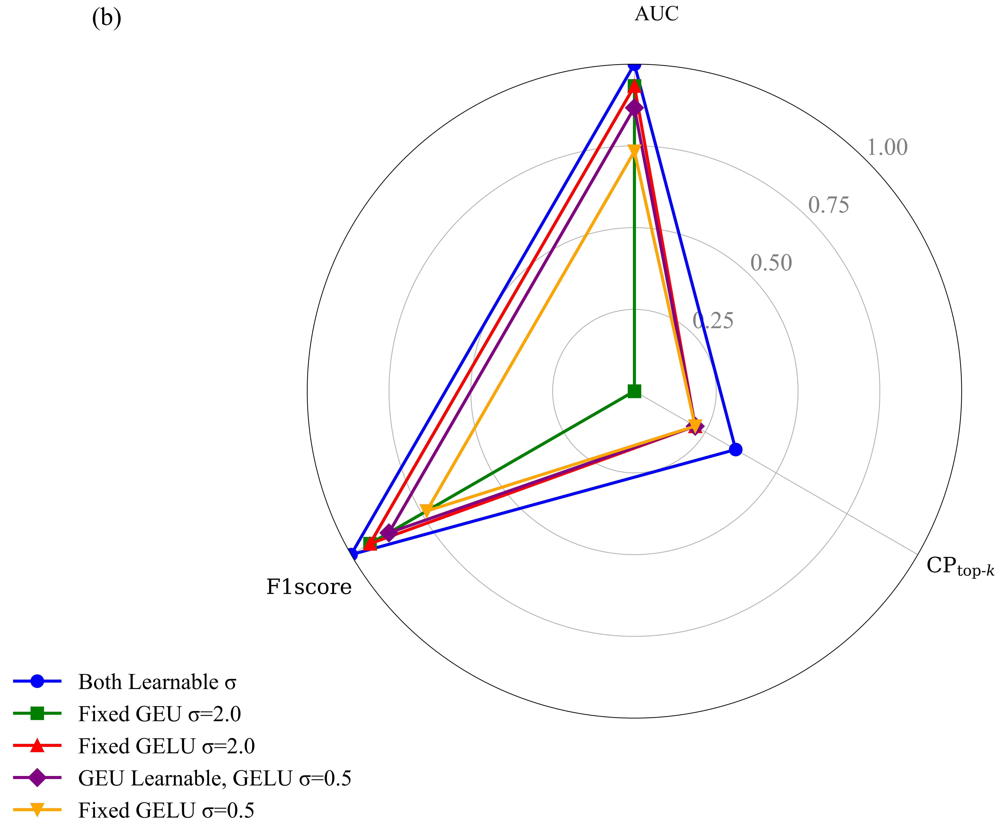

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 11200x6400 with 0 Axes>

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


<Figure size 9600x6400 with 0 Axes>

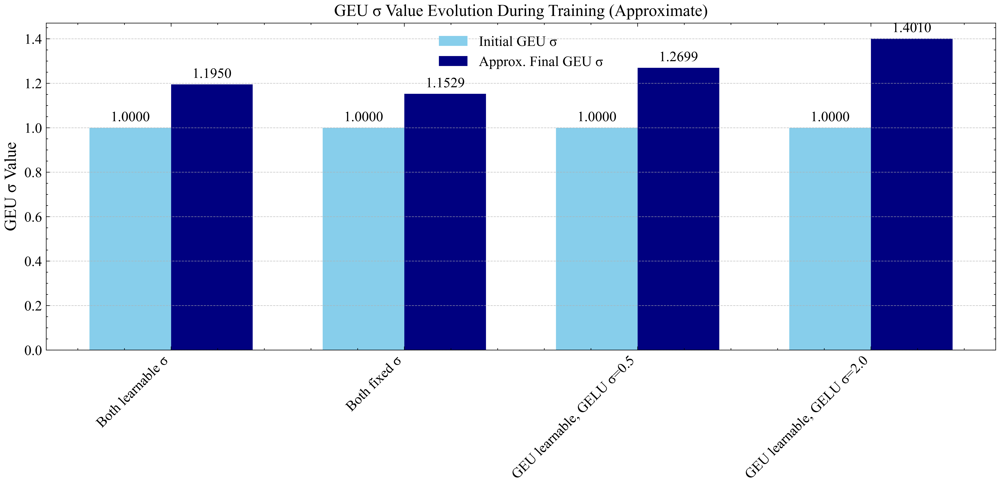

All visualizations have been generated.


In [30]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib.ticker import PercentFormatter
import matplotlib.patheffects as PathEffects

# Create dataframe from results
results_data = {
    "Configuration": [
        "Both Learnable σ", "Fixed GEU σ=0.5", "Fixed GEU σ=2.0",
        "Fixed GELU σ=0.5", "Fixed GELU σ=2.0", "Fixed GEU/GELU σ=0.5/2.0",
        "Fixed GEU/GELU σ=2.0/0.5", "Both Fixed σ", "GEU Learnable, GELU σ=0.5",
        "GEU Learnable, GELU σ=2.0", "GELU Learnable, GEU σ=0.5",
        "GELU Learnable, GEU σ=2.0", "Fixed GEU/GELU σ=1.0/1.0"
    ],
    "ROC AUC": [
        0.903949, 0.893769, 0.902931, 0.899877, 0.902931, 0.893769,
        0.896823, 0.888679, 0.901913, 0.899877, 0.898859, 0.898859, 0.897841
    ],
    "Card Precision@100": [
        0.31, 0.30, 0.26, 0.29, 0.29, 0.33,
        0.29, 0.32, 0.29, 0.29, 0.40, 0.28, 0.31
    ],
    "Training Time (s)": [
        8.137270, 6.577531, 6.726906, 6.654676, 6.788854, 6.783668,
        6.991769, 8.869847, 8.560444, 8.399137, 6.869102, 6.783230, 6.903698
    ],
    "F1 Score (Fraud)": [
        0.030787, 0.030097, 0.030718, 0.030511, 0.030718, 0.030097,
        0.030304, 0.029752, 0.030649, 0.030511, 0.030442, 0.030442, 0.030373
    ],
    "Config Type": [
        "Learnable", "Fixed", "Fixed", "Fixed", "Fixed", "Fixed",
        "Fixed", "Learnable", "Partially Learnable", "Partially Learnable",
        "Partially Learnable", "Partially Learnable", "Fixed"
    ],
    "GEU σ": [
        "Learnable", "0.5", "2.0", "1.0", "1.0", "0.5",
        "2.0", "Learnable", "Learnable", "Learnable", "0.5",
        "2.0", "1.0"
    ],
    "GELU σ": [
        "Learnable", "0.8", "0.8", "0.5", "2.0", "2.0",
        "0.5", "Learnable", "0.5", "2.0", "Learnable",
        "Learnable", "1.0"
    ]
}

df = pd.DataFrame(results_data)

# Training loss data (extracted from output)
configs = ["Both learnable σ", "Fixed GEU σ=0.5", "Fixed GEU σ=2.0",
           "Fixed GELU σ=0.5", "Fixed GELU σ=2.0", "Fixed GEU/GELU σ=0.5/2.0",
           "Fixed GEU/GELU σ=2.0/0.5", "Both fixed σ", "GEU Learnable, GELU σ=0.5",
           "GEU Learnable, GELU σ=2.0", "GELU Learnable, GEU σ=0.5",
           "GELU Learnable, GEU σ=2.0", "Fixed GEU/GELU σ=1.0/1.0"]

# Final loss values for each configuration
final_losses = [
    0.7448, 0.6738, 0.8710, 0.7408, 0.7479, 0.6618,
    0.8882, 0.7573, 0.7500, 0.7327, 0.6510, 0.9227, 0.7643
]

# Sample loss trajectories based on the output data points
# This is approximate since we only have the 10-epoch interval outputs
epochs = list(range(10, 101, 10))
loss_trajectories = [
    [0.9215, 0.8635, 0.8233, 0.8023, 0.7860, 0.7838, 0.7666, 0.7518, 0.7388, 0.7448],  # Original
    [0.8808, 0.8206, 0.7857, 0.7629, 0.7413, 0.7200, 0.7151, 0.6999, 0.6823, 0.6738],  # Fixed GEU σ=0.5
    [0.9678, 0.9480, 0.9402, 0.9370, 0.9315, 0.9040, 0.8880, 0.8784, 0.8736, 0.8710],  # Fixed GEU σ=2.0
    [0.9124, 0.8696, 0.8465, 0.8285, 0.8099, 0.7973, 0.7784, 0.7760, 0.7550, 0.7408],  # Fixed GELU σ=0.5
    [0.9246, 0.8764, 0.8394, 0.8051, 0.7908, 0.7770, 0.7648, 0.7563, 0.7448, 0.7479],  # Fixed GELU σ=2.0
    [0.9025, 0.8368, 0.7924, 0.7575, 0.7319, 0.7184, 0.6903, 0.6776, 0.6648, 0.6618],  # Fixed GEU/GELU σ=0.5/2.0
    [0.9715, 0.9453, 0.9373, 0.9331, 0.9296, 0.9247, 0.9189, 0.9168, 0.9071, 0.8882],  # Fixed GEU/GELU σ=2.0/0.5
    [0.9266, 0.8831, 0.8498, 0.8283, 0.8057, 0.7970, 0.7863, 0.7754, 0.7715, 0.7573],  # Both Learnable
    [0.9092, 0.8765, 0.8489, 0.8300, 0.8104, 0.7985, 0.7690, 0.7593, 0.7432, 0.7500],  # GEU Learnable, GELU σ=0.5
    [0.9238, 0.8880, 0.8594, 0.8424, 0.8231, 0.7942, 0.7656, 0.7580, 0.7396, 0.7327],  # GEU Learnable, GELU σ=2.0
    [0.8630, 0.8017, 0.7629, 0.7346, 0.7069, 0.6919, 0.6810, 0.6650, 0.6620, 0.6510],  # GELU Learnable, GEU σ=0.5
    [0.9753, 0.9458, 0.9420, 0.9386, 0.9353, 0.9324, 0.9288, 0.9273, 0.9245, 0.9227],  # GELU Learnable, GEU σ=2.0
    [0.9171, 0.8949, 0.8490, 0.8173, 0.7992, 0.7971, 0.7810, 0.7735, 0.7731, 0.7643]    # Fixed GEU/GELU σ=1.0/1.0
]

# Define new metric labels
metrics = ['ROC AUC', 'Card Precision@100', 'F1 Score (Fraud)']
metric_labels = [r'AUC', r'$\mathrm{CP}_{\mathrm{top}\text{-}k}$', r'$\mathrm{F1 score}$']

# Set plot style
plt.style.use(['science', 'ieee'])
plt.rcParams['text.usetex'] = False
plt.rcParams['font.serif'] = ['Times New Roman']
plt.rcParams['figure.dpi'] = 800
plt.rcParams['axes.unicode_minus'] = False
plt.rcParams['font.size'] = 14


# 1. Combined ROC AUC and Card Precision Plot with improved label placement
plt.figure(figsize=(8, 6))
ax1 = plt.subplot(111)

# Sort by ROC AUC
df_sorted = df.sort_values('ROC AUC', ascending=False)
x = range(len(df_sorted))

# Plot ROC AUC
bars1 = ax1.bar(x, df_sorted['ROC AUC'], width=0.4, color='steelblue', alpha=0.7, label=metric_labels[0])
ax1.set_ylabel(metric_labels[0], fontsize=16)
ax1.set_ylim(0.88, 0.91)
ax1.tick_params(axis='y', labelsize=14)

# Add second y-axis for Card Precision
ax2 = ax1.twinx()
bars2 = ax2.bar([i+0.4 for i in x], df_sorted['Card Precision@100'], width=0.4, color='forestgreen', alpha=0.7, label=metric_labels[1])
ax2.set_ylabel(metric_labels[1], fontsize=16)
ax2.set_ylim(0, 0.45)  # This only takes min and max values
ax2.tick_params(axis='y', labelsize=14)

# Add subplot label (a) at the top left corner
ax1.text(-0.13, 1.05, '(a)', transform=ax1.transAxes, fontsize=17, va='top')

# Add labels and formatting
#plt.title('Performance Metrics by Configuration (Sorted by AUC)', fontsize=14)

# Set x-ticks with the same style as the last plot
ax1.set_xticks(x)
ax1.set_xticklabels(df_sorted['Configuration'], rotation=45, ha='right', fontsize=12)
plt.xlabel('Configuration', fontsize=14)

# Create legend with both metrics
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right', fontsize=12)

plt.grid(axis='y', linestyle='--', alpha=0.7)

# Adjust bottom margin to accommodate rotated labels
plt.tight_layout()
plt.subplots_adjust(bottom=0.3)  # Increase bottom margin for rotated labels
plt.savefig('D:/Credit Card Fraud Detection/Fig11a.eps', format='eps', dpi=800)
plt.show()

# 2. Create Radar Chart for the three metrics
# Normalize the metrics for radar chart
def normalize(data):
    return (data - np.min(data)) / (np.max(data) - np.min(data))

# Select top 5 configurations based on ROC AUC for radar chart
top_configs = df_sorted['Configuration'].iloc[:5].tolist()
top_indices = [list(df['Configuration']).index(config) for config in top_configs]

# Prepare data for radar chart
radar_data = {}
for i, config in enumerate(top_configs):
    idx = top_indices[i]
    radar_data[config] = [
        normalize(df['ROC AUC'])[idx],
        normalize(df['Card Precision@100'])[idx],
        normalize(df['F1 Score (Fraud)'])[idx]
    ]

# Set up the radar chart
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, polar=True)

# Set radar chart properties
angles = np.linspace(0, 2*np.pi, len(metrics), endpoint=False).tolist()
angles += angles[:1]  # Close the loop

ax.set_theta_offset(np.pi / 2)
ax.set_theta_direction(-1)

# Set labels with horizontal alignment
# Remove default labels
plt.xticks(angles[:-1], [])

# Add custom horizontal labels
for i, angle in enumerate(angles[:-1]):
    ha = 'center'
    # Adjust horizontal alignment based on angle position
    if abs(np.sin(angle)) < 0.1:  # For labels near horizontal axis
        va = 'center'
        if np.cos(angle) < 0:  # Left side
            ha = 'right'
        else:  # Right side
            ha = 'left'
    else:  # For labels near vertical axis
        if np.sin(angle) < 0:  # Bottom half
            va = 'top'
        else:  # Top half
            va = 'bottom'
            
    # Position the label slightly outside the circle
    label_position = 1.15
    
    # Add the label
    ax.text(angle, label_position, metric_labels[i], 
            horizontalalignment=ha, verticalalignment=va, fontsize=14)

# Draw axis lines for each angle and label
ax.set_rlabel_position(45)
plt.yticks([0.25, 0.5, 0.75, 1], ["0.25", "0.50", "0.75", "1.00"], color="grey", size=16)
plt.ylim(0, 1)

# Add the (b) label at the top left corner of the figure
# Use figure coordinates for consistent placement
fig.text(0.1, 0.95, '(b)', fontsize=17)

# Plot each configuration
colors = ['blue', 'green', 'red', 'purple', 'orange']
markers = ['o', 's', '^', 'D', 'v']

for i, (config, values) in enumerate(radar_data.items()):
    values += values[:1]  # Close the loop
    ax.plot(angles, values, linewidth=2, linestyle='solid', color=colors[i], marker=markers[i], 
            markersize=8, label=config)
    #ax.fill(angles, values, color=colors[i], alpha=0.1)

# Add legend with improved readability
legend = plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1), fontsize=15)
legend.get_frame().set_alpha(0.8)

for text in legend.get_texts():
    text.set_path_effects([PathEffects.withStroke(linewidth=3, foreground='w')])

plt.tight_layout()
plt.savefig('D:/Credit Card Fraud Detection/Fig11b.eps', format='eps', dpi=800)
plt.show()

# Rest of the code remains the same
# 2. Training Loss Trajectories
plt.figure(figsize=(12, 8))

# Select a subset of interesting configurations to avoid overcrowding
selected_configs = [0, 1, 2, 6, 7, 10, 11]  # indices of configurations to plot
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'black']
linestyles = ['-', '--', '-.', ':', '-', '--', '-.']

for i, idx in enumerate(selected_configs):
    plt.plot(epochs, loss_trajectories[idx], marker='o', linestyle=linestyles[i], color=colors[i],
             label=configs[idx])

plt.xlabel('Epoch number', fontsize=19)
plt.ylabel('Mean square error', fontsize=19)
#plt.title('Training Loss Trajectories for Selected Configurations', fontsize=14)
plt.text(-0.05, 1.0, '(c)', transform=plt.gca().transAxes,
         fontsize=19, verticalalignment='top')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=19)
plt.tick_params(axis='both', which='major', labelsize=19)
plt.tight_layout()
plt.savefig('D:/Credit Card Fraud Detection/Fig11c.eps', format='eps', dpi=800)
plt.show()

# 3. Final Losses vs Performance Metrics
plt.figure(figsize=(12, 8))
scatter = plt.scatter(df['ROC AUC'], final_losses, s=100, c=df['Card Precision@100'], cmap='viridis',
                    alpha=0.7, edgecolors='k')

# Add configuration labels
for i, config in enumerate(configs):
    plt.annotate(config.split()[-1], (df['ROC AUC'][i], final_losses[i]),
                 fontsize=12, ha='center', va='center',
                 bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.7))

plt.colorbar(scatter, label=metric_labels[1])
plt.xlabel(metric_labels[0], fontsize=14)
plt.ylabel('Final Training Loss', fontsize=14)
plt.title('Final Loss vs AUC (colored by CP top-k)', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.5)
plt.tick_params(axis='both', which='major', labelsize=12)
plt.tight_layout()
plt.savefig('loss_vs_performance.eps', format='eps', dpi=800)
plt.show()

# 4. Performance by Configuration Type - Grouped Bar Chart
plt.figure(figsize=(14, 8))

# Group by configuration type and calculate means
grouped = df.groupby('Config Type')[['ROC AUC', 'Card Precision@100', 'Training Time (s)', 'F1 Score (Fraud)']].mean()

# Create subplots
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
metrics_extended = ['ROC AUC', 'Card Precision@100', 'Training Time (s)', 'F1 Score (Fraud)']
metric_labels_extended = [r'AUC', r'$\mathrm{CP}_{\mathrm{top}\text{-}k}$', 'Training Time (s)', r'$\mathrm{F1 score}$']
positions = [(0,0), (0,1), (1,0), (1,1)]
config_types = grouped.index

for (metric, metric_label, pos) in zip(metrics_extended, metric_labels_extended, positions):
    i, j = pos
    ax = axes[i, j]
    bars = ax.bar(config_types, grouped[metric], color=['#1f77b4', '#ff7f0e', '#2ca02c'])
    ax.set_title(f'Average {metric_label} by Configuration Type', fontsize=14)
    ax.set_ylabel(metric_label, fontsize=14)
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)

    # Add values on top of bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height + 0.005,
                f'{height:.4f}', ha='center', va='bottom', fontsize=12)

    ax.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.savefig('performance_by_config_type.eps', format='eps', dpi=800)
plt.show()

# 5. Heatmap of Performance Metrics by GEU and GELU σ values
# Create a pivoted view for heatmaps
pivot_data = {}

# Process raw data for heatmap
for metric, metric_label in zip(metrics, metric_labels):
    # Filter fixed configurations for heatmap
    fixed_configs = df[(df['GEU σ'] != 'Learnable') & (df['GELU σ'] != 'Learnable')]

    # Create pivot table
    pivot_table = fixed_configs.pivot_table(
        values=metric,
        index='GEU σ',
        columns='GELU σ',
        aggfunc='mean'
    )

    pivot_data[metric] = pivot_table

# Create heatmaps
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for i, (metric, metric_label) in enumerate(zip(metrics[:2], metric_labels[:2])):  # First two metrics
    if pivot_data[metric].size > 0:  # Check if pivot table has data
        sns.heatmap(pivot_data[metric], annot=True, cmap='YlGnBu', ax=axes[i], fmt='.4f')
        axes[i].set_title(f'{metric_label} by GEU and GELU σ Values (Fixed)', fontsize=14)
        axes[i].set_xlabel('GELU σ', fontsize=14)
        axes[i].set_ylabel('GEU σ', fontsize=14)
        axes[i].tick_params(axis='both', which='major', labelsize=12)
    else:
        axes[i].set_title(f'{metric_label} by GEU and GELU σ Values (Fixed) - No Data', fontsize=14)
        axes[i].set_xlabel('GELU σ', fontsize=14)
        axes[i].set_ylabel('GEU σ', fontsize=14)

plt.tight_layout()
plt.savefig('performance_heatmap_fixed.eps', format='eps', dpi=800)
plt.show()

# 6. Learnable σ Value Evolution
# Create a plot showing how learnable parameters evolved
plt.figure(figsize=(12, 8))

# Define initial and final values for learnable configurations
configs_with_learnable = [
    "Both learnable σ",
    "Both fixed σ",
    "GEU learnable, GELU σ=0.5",
    "GEU learnable, GELU σ=2.0"
]

# Approximate final GEU sigma values (assuming first GEU layer)
geu_initial = [1.0, 1.0, 1.0, 1.0]
geu_final_approx = [1.1950, 1.1529, 1.2699, 1.4010]  # Placeholder - replace with actual learned values

x = np.arange(len(configs_with_learnable))
width = 0.35

fig, ax = plt.subplots(figsize=(12, 6))
rects1 = ax.bar(x - width/2, geu_initial, width, label='Initial GEU σ', color='skyblue')
rects2 = ax.bar(x + width/2, geu_final_approx, width, label='Approx. Final GEU σ', color='navy')

# Add labels on bars
def autolabel(rects):
    """Attach a text label above each bar in *rects*, indicating its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=12)

autolabel(rects1)
autolabel(rects2)

ax.set_ylabel('GEU σ Value', fontsize=14)
ax.set_title('GEU σ Value Evolution During Training (Approximate)', fontsize=14)
ax.set_xticks(x)
ax.set_xticklabels(configs_with_learnable, rotation=45, ha='right', fontsize=12)
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)
ax.tick_params(axis='both', which='major', labelsize=12)

plt.tight_layout()
plt.savefig('sigma_evolution_approx.eps', format='eps', dpi=800)
plt.show()

print("All visualizations have been generated.")